In [1]:
import scanpy as sc
import torch
import matplotlib.pyplot as plt
import warnings
import numpy as np
import math

plt.rcdefaults()
warnings.filterwarnings("ignore")
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=600, frameon=True, vector_friendly=True, color_map=None, format='pdf', facecolor=None, transparent=True, ipython_format='png2x', figsize=(4, 5))

In [2]:
# Load the data
slice1 = sc.read_h5ad(f'E:/st_data/SANTO_data/8month_cr1_example_align.h5ad')
slice2 = sc.read_h5ad(f'E:/st_data/SANTO_data/8month_cr2_example_align.h5ad')
src_cor = np.array(slice1.obsm['spatial'])
tgt_cor = np.array(slice2.obsm['spatial'])
src_center = src_cor.mean(axis=0)
tgt_center = tgt_cor.mean(axis=0)
    
radian = math.radians(90)
rotation = np.array([[ np.cos(radian), -np.sin(radian)],
                     [np.sin(radian),  np.cos(radian)]])
    
src_shifted = src_cor - src_center
src_rotated = np.dot(src_shifted, rotation.T)
src_final = src_rotated + tgt_center
slice1.obsm['spatial'] = src_final

In [3]:
slice1, slice2

(AnnData object with n_obs × n_vars = 8506 × 2766
     obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'sex', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'orig_index', 'batch', 'time', 'group', 'replicate', 'label', 'region', 'region_merged', 'top_level_cell_type', 'sub_level_cell_type'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 9803 × 2766
     obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'sex', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'orig_index', 'batch', 'time', 'group', 'replicate', 'label', 'region', 'region_merged', 'top_level_cell_type', 'sub_level_cell_type'
     obsm: 'spatial')

In [3]:
import numpy as np
import scipy.sparse as sp
from scipy.stats import poisson

def inject_poisson_noise(adata, scale_factor=0.1, feature_key='X'):
    if feature_key == 'X':
        X_dense = adata.X.toarray() if sp.issparse(adata.X) else adata.X
    else:
        X_dense = adata.layers[feature_key].toarray() if sp.issparse(adata.layers[feature_key]) else adata.layers[feature_key]

    X_noisy = X_dense.copy()    
    non_zero_indices = X_dense > 0
    lambda_values = X_dense[non_zero_indices] * scale_factor
    noise = poisson.rvs(mu=lambda_values)
    
    # add noise
    X_noisy[non_zero_indices] = X_noisy[non_zero_indices] + noise - np.floor(lambda_values) # 简化处理，旨在引入波动
    X_noisy[X_noisy < 0] = 0
    adata.layers['raw'] = adata.X.copy() if feature_key == 'X' else adata.layers[feature_key].copy()
    
    if feature_key == 'X':
        adata.X = sp.csr_matrix(X_noisy) if sp.issparse(adata.X) else X_noisy
    else:
        adata.layers[f'{feature_key}_noisy_{scale_factor}'] = sp.csr_matrix(X_noisy)

    print(f"已在 {feature_key} 中注入 scale_factor={scale_factor} 的泊松噪声。")
    return adata

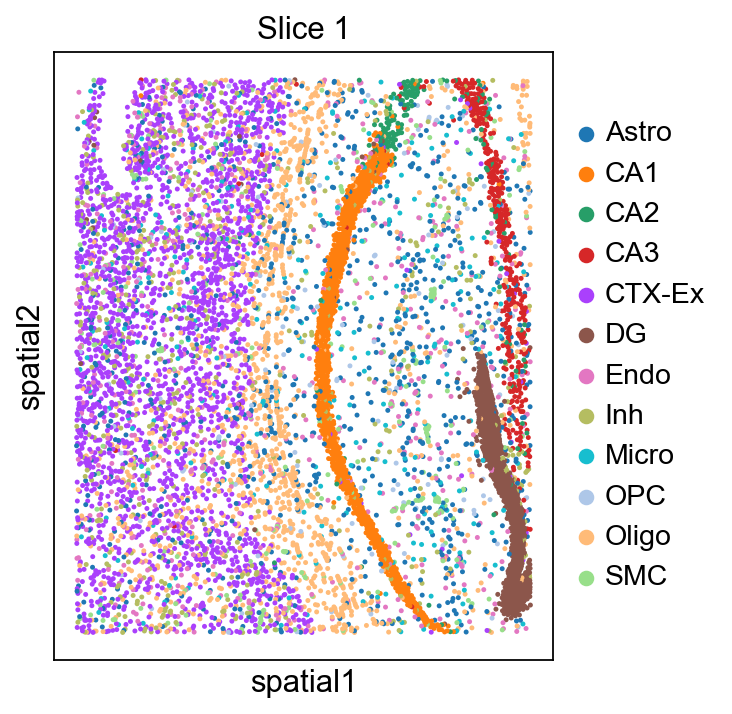

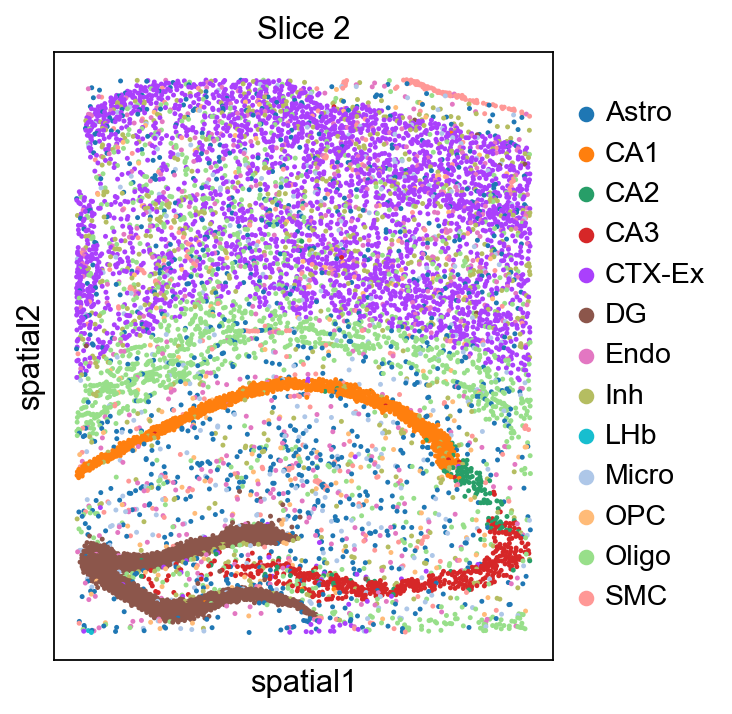

In [4]:
# sc.pp.subsample(slice1, fraction=0.1, random_state=0)
# sc.pp.subsample(slice2, fraction=0.1, random_state=0)
sc.pl.embedding(slice1, basis='spatial', color='top_level_cell_type', size=20, title='Slice 1')
sc.pl.embedding(slice2, basis='spatial', color='top_level_cell_type', size=20, title='Slice 2')

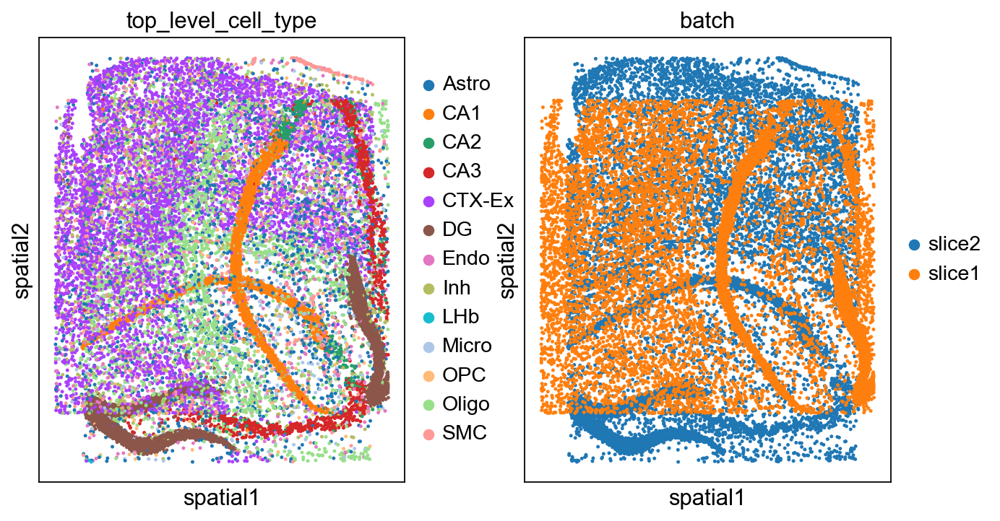

In [5]:
import anndata as ad

section_ids = ['slice2', 'slice1']
adata_cat = ad.concat([slice2, slice1], label='batch', keys=section_ids)
sc.pl.embedding(adata_cat, basis='spatial', color=['top_level_cell_type', 'batch'], size=20)

In [6]:
from scipy.spatial import cKDTree

src_cor = np.array(slice1.obsm['spatial'])
tgt_cor = np.array(slice2.obsm['spatial'])

src_exp = slice1.X.A
tgt_exp = slice2.X.A
src_ct = np.asarray(slice1.obs['top_level_cell_type'])
tgt_ct = np.asarray(slice2.obs['top_level_cell_type'])

kd_tree = cKDTree(tgt_cor)
distances, indices = kd_tree.query(src_cor, k=1)
pccs = np.empty(src_cor.shape[0], dtype=float)
match_count = 0
for i, j in enumerate(indices):
    r = np.corrcoef(src_exp[i], tgt_exp[j])[0, 1]
    pccs[i] = r

    if src_ct[i] == tgt_ct[j]:
        match_count += 1

pcc_mean = np.nanmean(pccs)
cri = match_count / src_cor.shape[0]
pcc_mean, cri

(0.12554916876751415, 0.14660239830707736)

### Add noise

In [7]:
slice1 = inject_poisson_noise(slice1, scale_factor=20, feature_key='X')
slice2 = inject_poisson_noise(slice2, scale_factor=20, feature_key='X')
slice1, slice2

已在 X 中注入 scale_factor=20 的泊松噪声。
已在 X 中注入 scale_factor=20 的泊松噪声。


(AnnData object with n_obs × n_vars = 8506 × 2766
     obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'sex', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'orig_index', 'batch', 'time', 'group', 'replicate', 'label', 'region', 'region_merged', 'top_level_cell_type', 'sub_level_cell_type'
     uns: 'top_level_cell_type_colors'
     obsm: 'spatial'
     layers: 'raw',
 AnnData object with n_obs × n_vars = 9803 × 2766
     obs: 'biosample_id', 'donor_id', 'species', 'species__ontology_label', 'sex', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'orig_index', 'batch', 'time', 'group', 'replicate', 'label', 'region', 'region_merged', 'top_level_cell_type', 'sub_level_cell_type'
     uns: 'top_level_cell_type_colors'
     obsm: 'spatial'
     layers: 'raw')

### Perform slice alignment

In [8]:
sc.pp.filter_cells(slice1, min_genes=10)
sc.pp.filter_genes(slice1, min_cells=3)
slice1.layers['counts'] = slice1.X.copy()
sc.pp.log1p(slice1)
sc.pp.highly_variable_genes(slice1, n_top_genes=2000)

sc.pp.filter_cells(slice2, min_genes=10)
sc.pp.filter_genes(slice2, min_cells=3)
slice2.layers['counts'] = slice2.X.copy()
sc.pp.log1p(slice2)
sc.pp.highly_variable_genes(slice2, n_top_genes=2000)

slice1.var_names_make_unique()
slice2.var_names_make_unique()

section_ids = ['slice1', 'slice2']
slice1.obs['batch'] = section_ids[0]
slice2.obs['batch'] = section_ids[1]

Training on cuda, please wait...


Epoch: 199, Loss: -422.102 step time=0.073s: 100%|██████████| 200/200 [00:15<00:00, 12.76it/s]


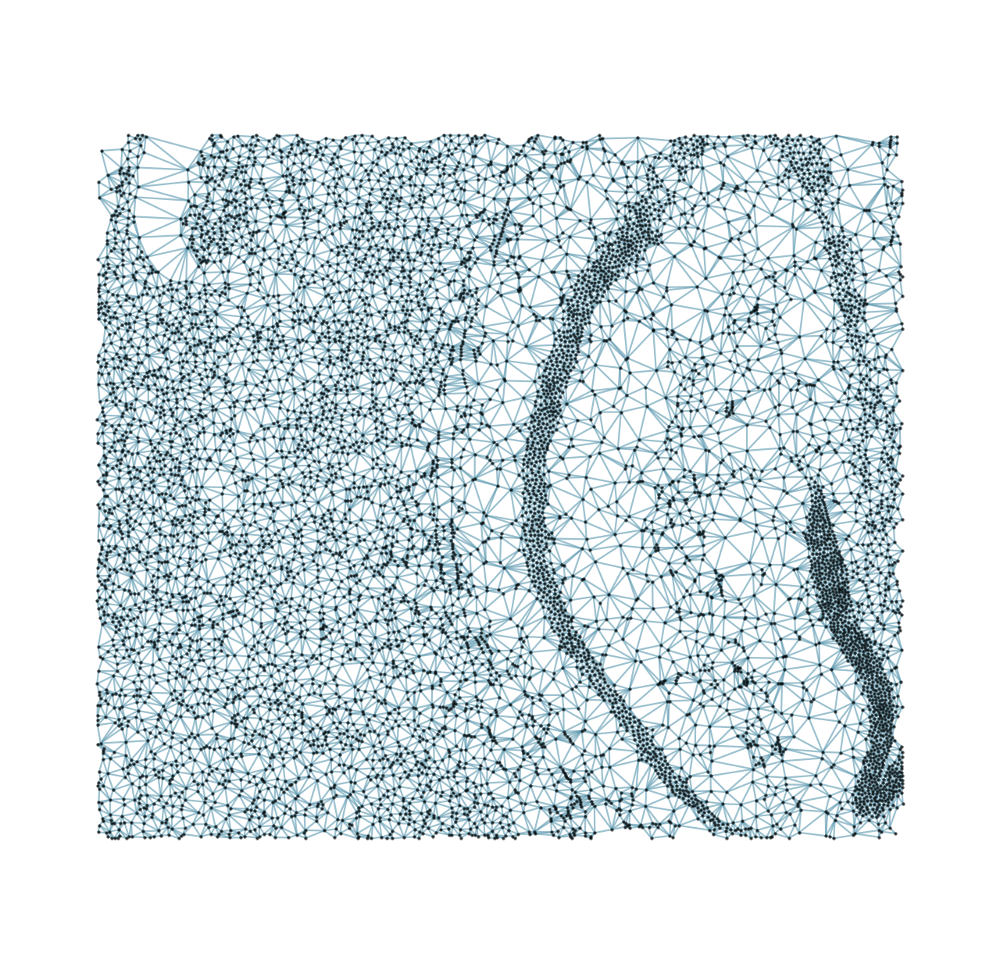

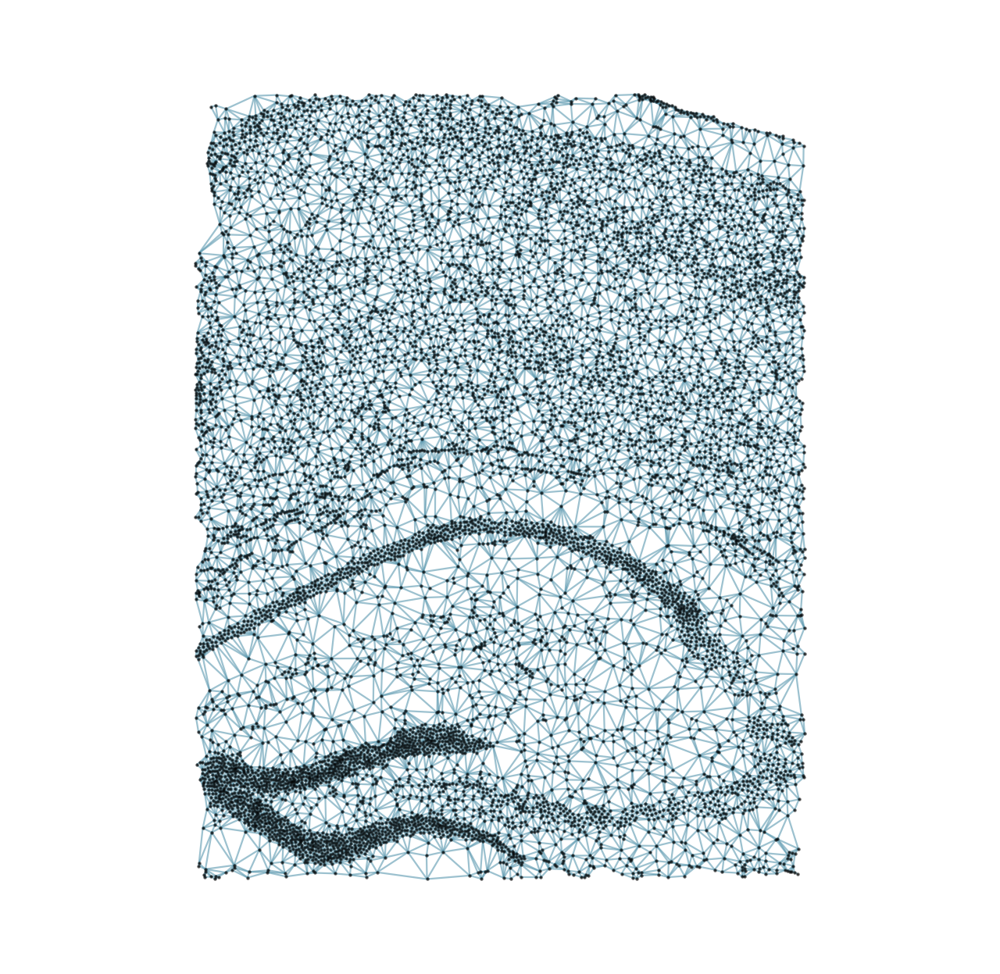

In [9]:
from GEASO.utils.utils import intersect, feature_extract

common_genes = intersect(slice1.var_names, slice2.var_names)
slice1 = slice1[:, common_genes]
slice2 = slice2[:, common_genes]

adata_list = [slice1, slice2]
emb_dict, loss_log, model = feature_extract(adata_list)
torch.cuda.empty_cache()

In [10]:
slice1.obsm['latent'] = emb_dict[section_ids[0]].cpu().numpy()
slice2.obsm['latent'] = emb_dict[section_ids[1]].cpu().numpy()

In [11]:
slice2.obsm['spatial'] = slice2.obsm['spatial'].astype('float')

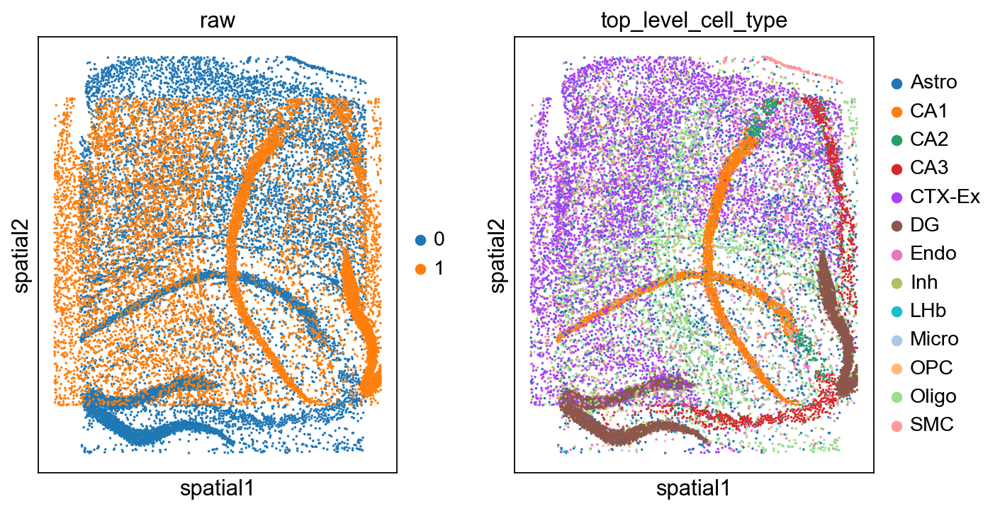

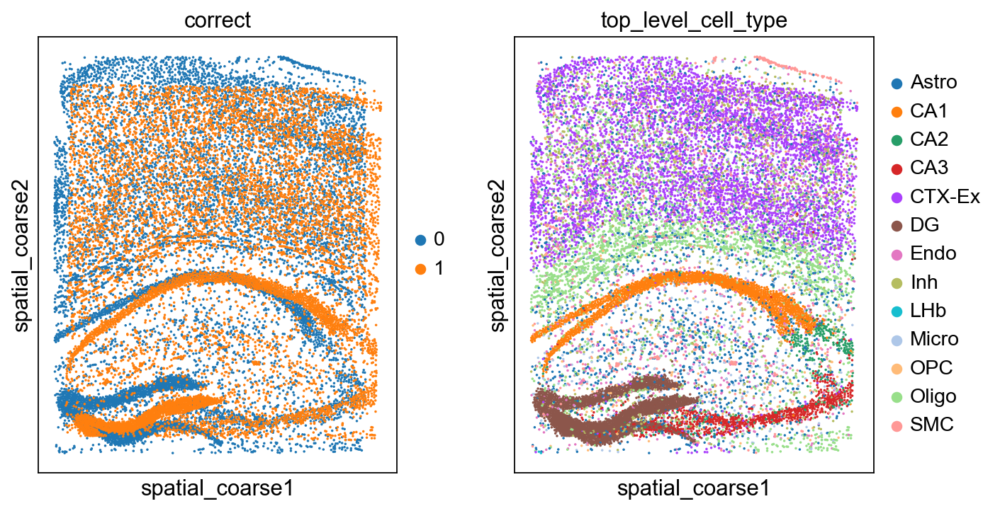

In [12]:
from GEASO.alignment.coarse_alignment import coarse_alignment

R, t, scale, P, spatial_scales, spatial_means, guided_source, guided_target, coarse_source, coarse_target = coarse_alignment(source=slice1, target=slice2, top_K=10, dis_metric='cos', use_latent=True, scale_c=False)

slice1.obsm['spatial_coarse'] = coarse_source.copy()
slice2.obsm['spatial_coarse'] = coarse_target.copy()
adata_cat = ad.concat([slice2, slice1], label='batch')
sc.pl.embedding(adata_cat, basis='spatial', color=['batch', 'top_level_cell_type'], size=10, title='raw')
sc.pl.embedding(adata_cat, basis='spatial_coarse', color=['batch', 'top_level_cell_type'], size=10, title='correct')

In [13]:
from GEASO.alignment.elastic_registration import ElasticRegistration

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
register_model = ElasticRegistration(
    init_P=P,
    guided_source=guided_source,
    guided_target=guided_target,
    source_slice=slice1,
    target_slice=slice2,
    normalize_scales=spatial_scales,
    normalize_means=spatial_means,
    spatial_key='spatial_coarse',
    device=device,
    tau=0.3,
    max_iter=400,
    # lambda_VF=1e0,
)

Local structure kernel constructed with shape: torch.Size([8506, 100])


Slice Alignment: 100%|██████████| 400/400 [00:04<00:00, 97.18it/s] 


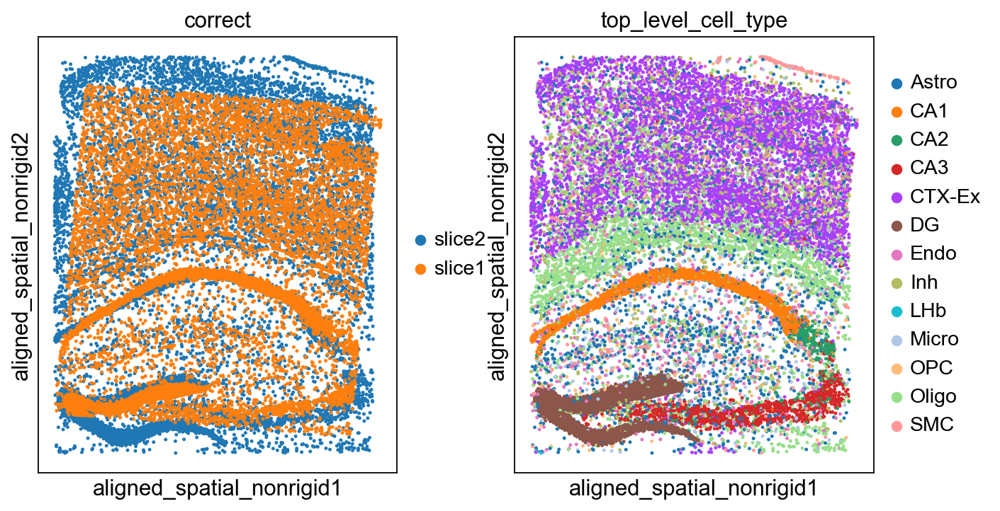

In [14]:
import anndata as ad

slice2.obsm['aligned_spatial_nonrigid'] = slice2.obsm['spatial'].copy()
adata_cat = ad.concat([slice2, slice1], label='batch', keys=['slice2', 'slice1'])
sc.pl.embedding(adata_cat, basis='aligned_spatial_nonrigid', color=['batch', 'top_level_cell_type'], size=20, title='correct')

In [15]:
from scipy.spatial import cKDTree

src_cor = np.array(slice1.obsm['aligned_spatial_nonrigid'])
tgt_cor = np.array(slice2.obsm['aligned_spatial_nonrigid'])

src_exp = slice1.layers['raw'].A
tgt_exp = slice2.layers['raw'].A
src_ct = np.asarray(slice1.obs['top_level_cell_type'])
tgt_ct = np.asarray(slice2.obs['top_level_cell_type'])

kd_tree = cKDTree(tgt_cor)
distances, indices = kd_tree.query(src_cor, k=1)
pccs = np.empty(src_cor.shape[0], dtype=float)
match_count = 0
for i, j in enumerate(indices):
    r = np.corrcoef(src_exp[i], tgt_exp[j])[0, 1]
    pccs[i] = r

    if src_ct[i] == tgt_ct[j]:
        match_count += 1

pcc_mean = np.nanmean(pccs)
cri = match_count / src_cor.shape[0]
pcc_mean, cri

(0.17181656539221143, 0.4148836115683047)